# Importing Necessary packages and datasets

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

import plotly
from plotly import tools
import plotly.express as px 

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

import lightgbm as lgb
from sklearn.metrics import mean_squared_error

from bayes_opt import BayesianOptimization

In [2]:
build_data = pd.read_csv('data/building_metadata.csv')
build_data.head()

,site_id,building_id,primary_use,square_feet,year_built,floor_count
0,0,0,Education,7432,2008.0,NaN
1,0,1,Education,2720,2004.0,NaN
2,0,2,Education,5376,1991.0,NaN
3,0,3,Education,23685,2002.0,NaN
4,0,4,Education,116607,1975.0,NaN


In [3]:
train = pd.read_csv('data/train.csv')
train.head()

,building_id,meter,timestamp,meter_reading
0,0,0,2016-01-01 00:00:00,0.0
1,1,0,2016-01-01 00:00:00,0.0
2,2,0,2016-01-01 00:00:00,0.0
3,3,0,2016-01-01 00:00:00,0.0
4,4,0,2016-01-01 00:00:00,0.0


In [4]:
weather_train = pd.read_csv('data/weather_train.csv')
weather_train.head()

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,2016-01-01 00:00:00,25.0,6.0,20.0,NaN,1019.7,0.0,0.0
1,0,2016-01-01 01:00:00,24.4,NaN,21.1,-1.0,1020.2,70.0,1.5
2,0,2016-01-01 02:00:00,22.8,2.0,21.1,0.0,1020.2,0.0,0.0
3,0,2016-01-01 03:00:00,21.1,2.0,20.6,0.0,1020.1,0.0,0.0
4,0,2016-01-01 04:00:00,20.0,2.0,20.0,-1.0,1020.0,250.0,2.6


In [5]:
test = pd.read_csv('data/test.csv')
test.head()

,row_id,building_id,meter,timestamp
0,0,0,0,2017-01-01 00:00:00
1,1,1,0,2017-01-01 00:00:00
2,2,2,0,2017-01-01 00:00:00
3,3,3,0,2017-01-01 00:00:00
4,4,4,0,2017-01-01 00:00:00


In [6]:
weather_test = pd.read_csv('data/weather_test.csv')
weather_test.head()

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,2017-01-01 00:00:00,17.8,4.0,11.7,NaN,1021.4,100.0,3.6
1,0,2017-01-01 01:00:00,17.8,2.0,12.8,0.0,1022.0,130.0,3.1
2,0,2017-01-01 02:00:00,16.1,0.0,12.8,0.0,1021.9,140.0,3.1
3,0,2017-01-01 03:00:00,17.2,0.0,13.3,0.0,1022.2,140.0,3.1
4,0,2017-01-01 04:00:00,16.7,2.0,13.3,0.0,1022.3,130.0,2.6


In [18]:
np.iinfo(np.int8).max

127

In [11]:
## Function to reduce the DF size
## Modified from https://www.kaggle.com/gemartin/load-data-reduce-memory-usage by @gemartin

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [12]:
train = reduce_mem_usage(train)
test = reduce_mem_usage(test)
weather_train = reduce_mem_usage(weather_train)
weather_test = reduce_mem_usage(weather_test)
build_data = reduce_mem_usage(build_data)

Mem. usage decreased to 289.19 Mb (0.0% reduction)
Mem. usage decreased to 596.49 Mb (0.0% reduction)
Mem. usage decreased to  3.07 Mb (0.0% reduction)
Mem. usage decreased to  6.08 Mb (0.0% reduction)
Mem. usage decreased to  0.03 Mb (0.0% reduction)


In [13]:
train = train.merge(build_data, on='building_id', how='left')
train = train.merge(weather_train, on=['site_id', 'timestamp'], how='left')

test = test.merge(build_data, on='building_id', how='left')
test = test.merge(weather_test, on=['site_id', 'timestamp'], how='left')

In [19]:
train.head()

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,0,2016-01-01 00:00:00,0.0,0,Education,7432,2008.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
1,1,0,2016-01-01 00:00:00,0.0,0,Education,2720,2004.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
2,2,0,2016-01-01 00:00:00,0.0,0,Education,5376,1991.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
3,3,0,2016-01-01 00:00:00,0.0,0,Education,23685,2002.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0
4,4,0,2016-01-01 00:00:00,0.0,0,Education,116607,1975.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0


In [20]:
test.head()

,row_id,building_id,meter,timestamp,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,0,0,2017-01-01 00:00:00,0,Education,7432,2008.0,NaN,17.796875,4.0,11.703125,NaN,1021.5,100.0,3.599609
1,1,1,0,2017-01-01 00:00:00,0,Education,2720,2004.0,NaN,17.796875,4.0,11.703125,NaN,1021.5,100.0,3.599609
2,2,2,0,2017-01-01 00:00:00,0,Education,5376,1991.0,NaN,17.796875,4.0,11.703125,NaN,1021.5,100.0,3.599609
3,3,3,0,2017-01-01 00:00:00,0,Education,23685,2002.0,NaN,17.796875,4.0,11.703125,NaN,1021.5,100.0,3.599609
4,4,4,0,2017-01-01 00:00:00,0,Education,116607,1975.0,NaN,17.796875,4.0,11.703125,NaN,1021.5,100.0,3.599609


In [21]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20216100 entries, 0 to 20216099
Data columns (total 16 columns):
building_id           int16
meter                 int8
timestamp             object
meter_reading         float32
site_id               int8
primary_use           object
square_feet           int32
year_built            float16
floor_count           float16
air_temperature       float16
cloud_coverage        float16
dew_temperature       float16
precip_depth_1_hr     float16
sea_level_pressure    float16
wind_direction        float16
wind_speed            float16
dtypes: float16(9), float32(1), int16(1), int32(1), int8(2), object(2)
memory usage: 1.0+ GB


In [22]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41697600 entries, 0 to 41697599
Data columns (total 16 columns):
row_id                int32
building_id           int16
meter                 int8
timestamp             object
site_id               int8
primary_use           object
square_feet           int32
year_built            float16
floor_count           float16
air_temperature       float16
cloud_coverage        float16
dew_temperature       float16
precip_depth_1_hr     float16
sea_level_pressure    float16
wind_direction        float16
wind_speed            float16
dtypes: float16(9), int16(1), int32(2), int8(2), object(2)
memory usage: 2.1+ GB


# Exploratory Data Analysis

In [202]:
# Plots distribution of a single feature 

def dist_plot(column):
    fig, ax = plt.subplots(figsize=(15,10))
    sns.distplot(train[column].dropna(), 
                 color='red', ax=ax).set_title(column + 'distribution', fontsize=18)
    sns.distplot(test[column].dropna(), 
                 color='green', ax=ax).set_title(column + ' distribution', fontsize=18)
    ax.set_xlabel(column, fontsize=15)
    ax.legend(['train', 'test'], fontsize=15)
    plt.show()
    

## Meter Reading

In [25]:
train['timestamp'] = pd.to_datetime(train['timestamp'])
test['timestamp'] = pd.to_datetime(test['timestamp'])

In [16]:
D = train[['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
H = train[['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading']

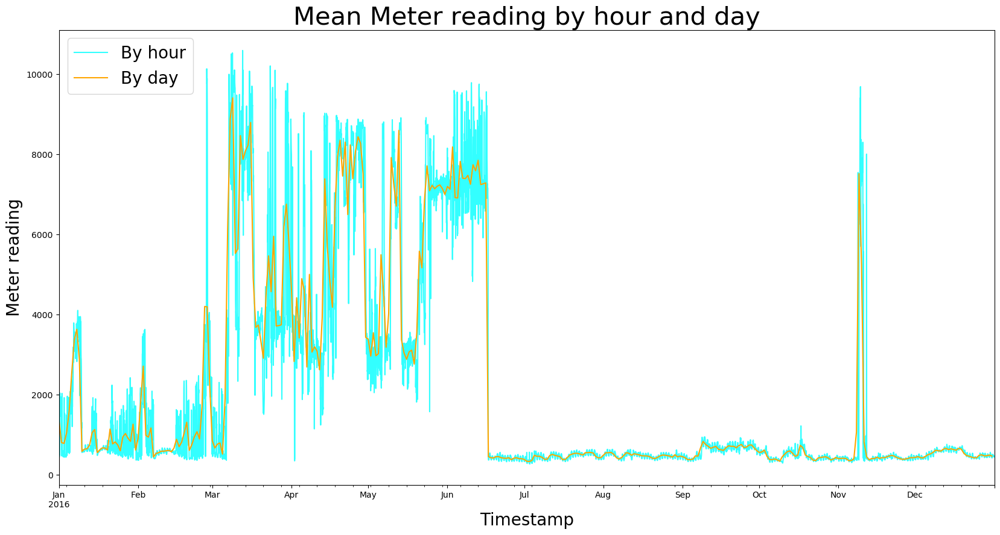

In [17]:
fig, axes = plt.subplots(figsize=(20,10), dpi=100)
H.plot(ax=axes, label='By hour', alpha=0.8, color='aqua')
D.plot(ax=axes, label='By day', alpha=1, color='orange')
axes.set_title('Mean Meter reading by hour and day', fontsize=30)
axes.set_ylabel('Meter reading', fontsize=20)
axes.set_xlabel('Timestamp', fontsize=20)
axes.legend(fontsize=20)

<Figure size 1000x1000 with 0 Axes>

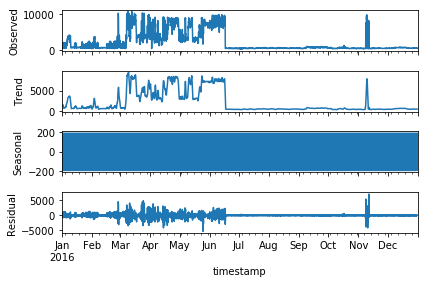

In [18]:
H_decomposition = sm.tsa.seasonal_decompose(H, model='additive')
fig = plt.figure(figsize=(10,10), dpi=100)
ax1 = H_decomposition.plot()
plt.show()

<Figure size 1000x1000 with 0 Axes>

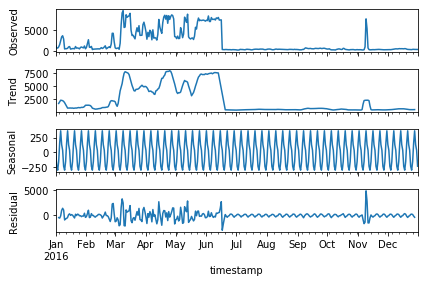

In [19]:
D_decomposition = sm.tsa.seasonal_decompose(D, model='additive')
fig = plt.figure(figsize=(10,10), dpi=100)
ax1 = D_decomposition.plot()
plt.show()

In [20]:
train['site_id'].nunique()

16

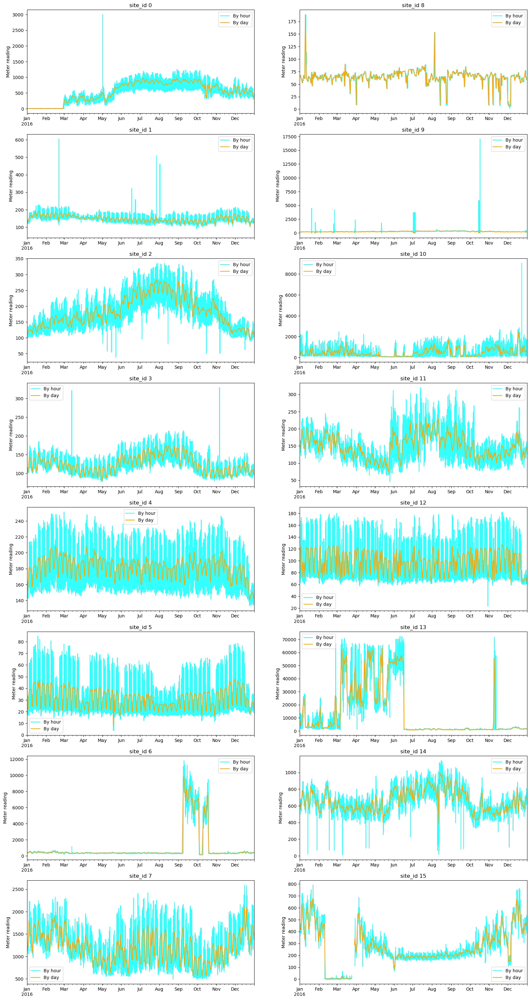

In [21]:
fig, axes = plt.subplots(8,2, figsize=(20,40), dpi=100)
for i in range(train['site_id'].nunique()):
    D = train[train['site_id'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    H = train[train['site_id'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading']
    H.plot(ax=axes[i%8][i//8], label='By hour', alpha=0.8, color='aqua')
    D.plot(ax=axes[i%8][i//8], label='By day', alpha=1, color='orange')
    axes[i%8][i//8].set_title('site_id {}' .format(i))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('Meter reading')
    axes[i%8][i//8].legend()

In [22]:
train['meter'].nunique()

4

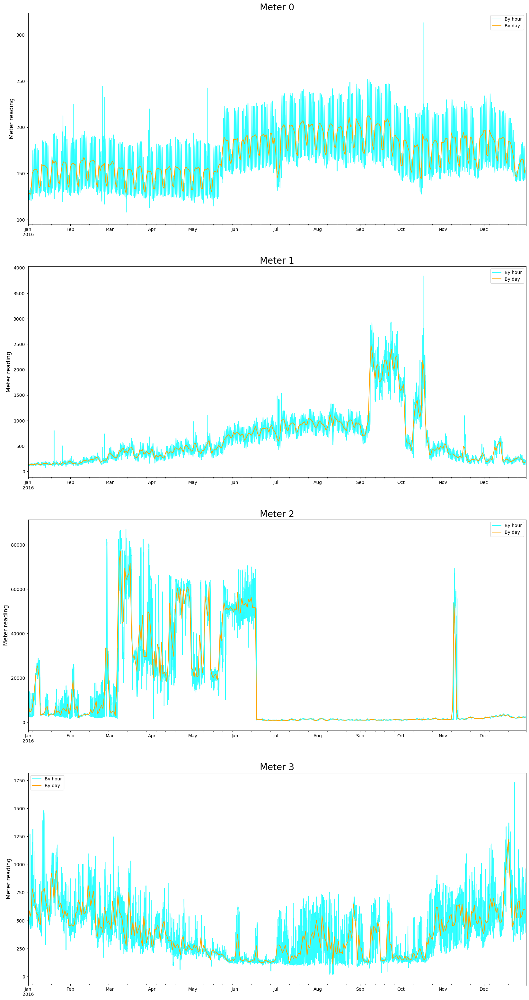

In [23]:
fig, axes = plt.subplots(4,1, figsize=(20,40), dpi=100)
for i in range(train['meter'].nunique()):
    D = train[train['meter'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    H = train[train['meter'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading']
    H.plot(ax=axes[i], label='By hour', alpha=0.8, color='aqua')
    D.plot(ax=axes[i], label='By day', alpha=1, color='orange')
    axes[i].set_title('Meter {}' .format(i), fontsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Meter reading', fontsize=13)
    axes[i].legend()

In [24]:
train['primary_use'].nunique()

16

In [25]:
train['primary_use'].value_counts().index.to_list()

['Education',
 'Office',
 'Entertainment/public assembly',
 'Lodging/residential',
 'Public services',
 'Healthcare',
 'Other',
 'Parking',
 'Manufacturing/industrial',
 'Food sales and service',
 'Retail',
 'Warehouse/storage',
 'Services',
 'Technology/science',
 'Utility',
 'Religious worship']

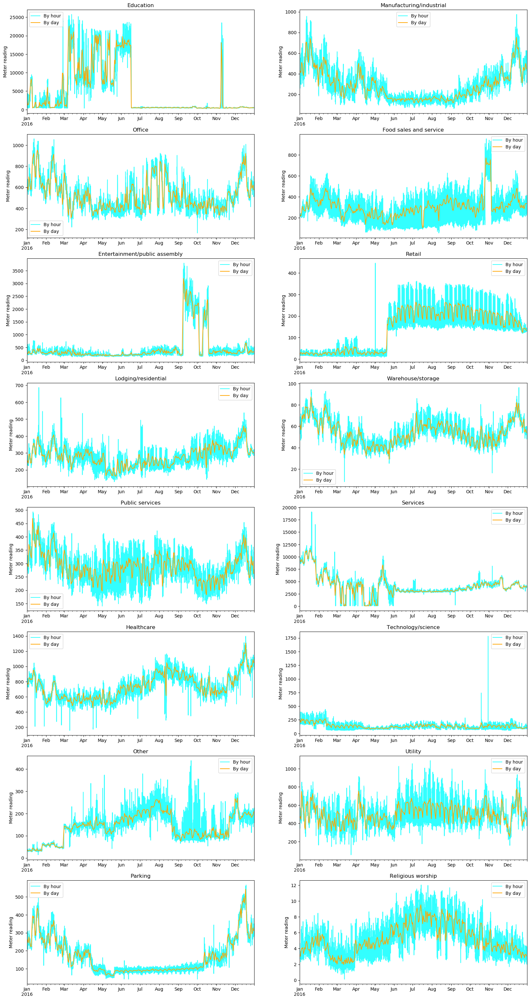

In [26]:
fig, axes = plt.subplots(8,2, figsize=(20,40), dpi=100)
for i, prim_use in enumerate(train['primary_use'].value_counts().index.to_list()):
    D = train[train['primary_use'] == prim_use][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    H = train[train['primary_use'] == prim_use][['timestamp', 'meter_reading']].set_index('timestamp').resample('H').mean()['meter_reading']
    H.plot(ax=axes[i%8][i//8], label='By hour', alpha=0.8, color='aqua')
    D.plot(ax=axes[i%8][i//8], label='By day', alpha=1, color='orange')
    axes[i%8][i//8].set_title('{}' .format(prim_use))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('Meter reading')
    axes[i%8][i//8].legend()

## Meter

In [54]:
train_meter_count = train['meter'].value_counts()
train_meter_per = train_meter_count/train['meter'].count()
meter_train = pd.concat([train_meter_count, train_meter_per], axis=1, keys=['Total','Percent'])
meter_train

,Total,Percent
0,12060910,0.596599
1,4182440,0.206887
2,2708713,0.133988
3,1264037,0.062526


[Text(0, 0, 'electricity'),
 Text(0, 0, 'chilledwater'),
 Text(0, 0, 'steam'),
 Text(0, 0, 'hotwater')]

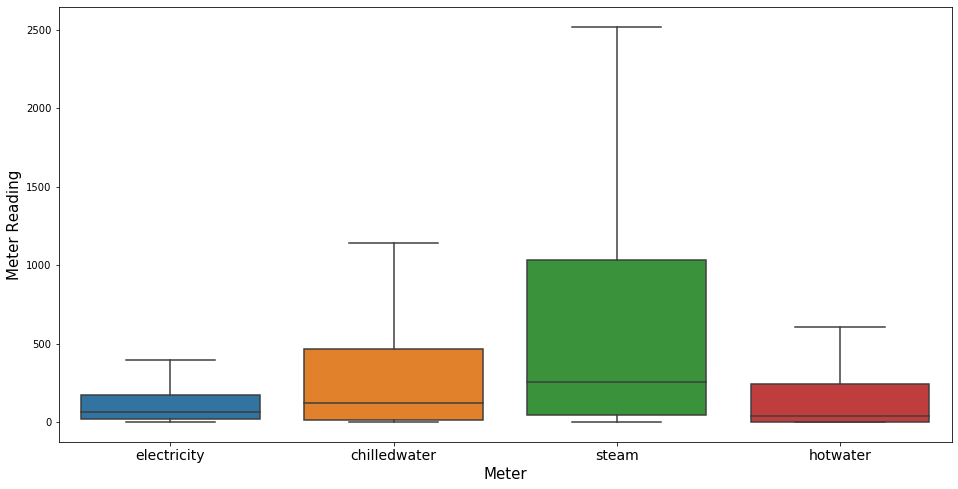

In [27]:
fig = plt.figure(figsize=(16,8))
ax = sns.boxplot(x='meter', y='meter_reading', data=train, showfliers=False)
ax.set_xlabel('Meter', fontsize=15)
ax.set_ylabel('Meter Reading', fontsize=15)
ax.set_xticklabels(['electricity', 'chilledwater', 'steam', 'hotwater'], fontsize=14)

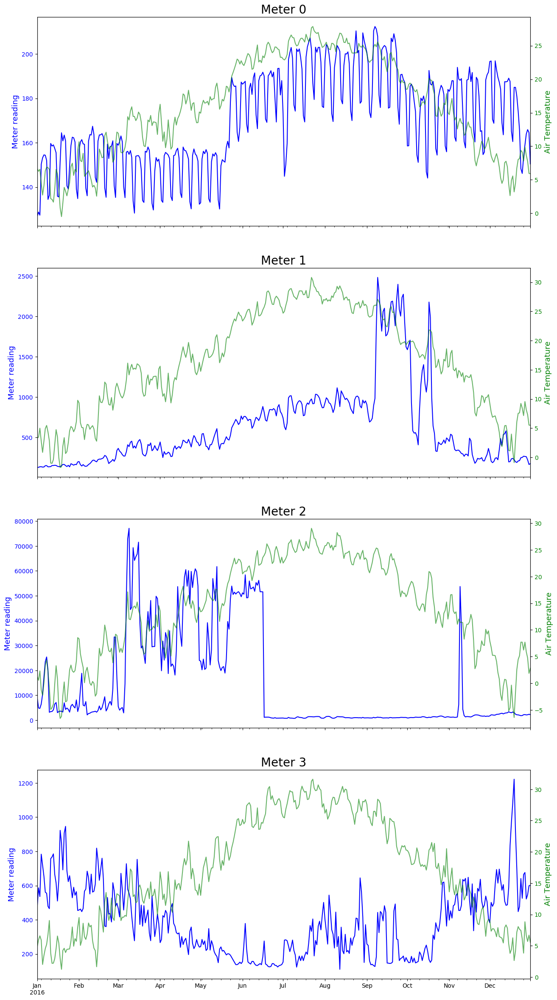

In [28]:
fig, axes = plt.subplots(4,1, figsize=(15,30), dpi=100)
axes2 = axes
for i in range(train['meter'].nunique()):
    D = train[train['meter'] == i][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    T = train[train['meter'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('D').mean()['air_temperature']
    
    
    D.plot(ax=axes[i], label='Meter Reading', alpha=1, color='blue')
    axes[i].set_title('Meter {}' .format(i), fontsize=20)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Meter reading', fontsize=13, color='blue')
    axes[i].tick_params(axis='y', labelcolor='blue')
    
    axes2[i] = axes[i].twinx()
    T.plot(ax=axes2[i], label='Air Temperature', alpha = 0.6, color='green')
    axes2[i].set_xlabel('')
    axes2[i].set_ylabel('Air Temperature', fontsize=13, color='green')
    axes2[i].tick_params(axis='y', labelcolor='green')

## site_id

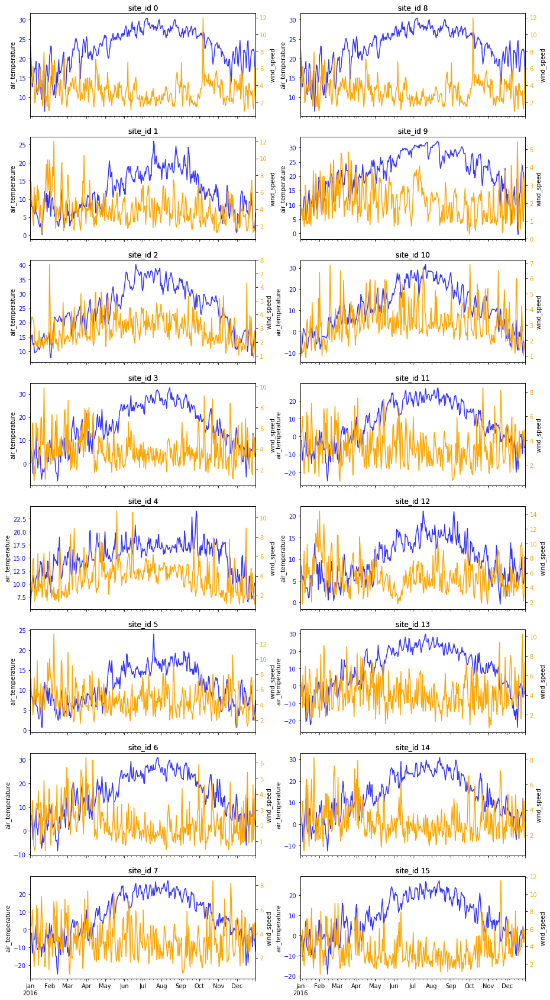

In [29]:
fig, axes = plt.subplots(8,2, figsize=(15,30))
axes2 = axes
for i in range(train['site_id'].nunique()):
    air_temp = train[train['site_id'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('D').mean()['air_temperature']
    air_temp.plot(ax=axes[i%8][i//8], label='air_temperature', alpha=0.8, color='blue')
    axes[i%8][i//8].set_title('site_id {}' .format(i))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('air_temperature')
    axes[i%8][i//8].tick_params(axis='y', labelcolor='blue')

    axes2[i%8][i//8] = axes[i%8][i//8].twinx()
    wind = train[train['site_id'] == i][['timestamp', 'wind_speed']].set_index('timestamp').resample('D').mean()['wind_speed']
    wind.plot(ax=axes2[i%8][i//8], label='wind_speed', alpha=1, color='orange')
    axes2[i%8][i//8].set_title('site_id {}' .format(i))
    axes2[i%8][i//8].set_xlabel('')
    axes2[i%8][i//8].set_ylabel('wind_speed')
    axes2[i%8][i//8].tick_params(axis='y', labelcolor='orange')

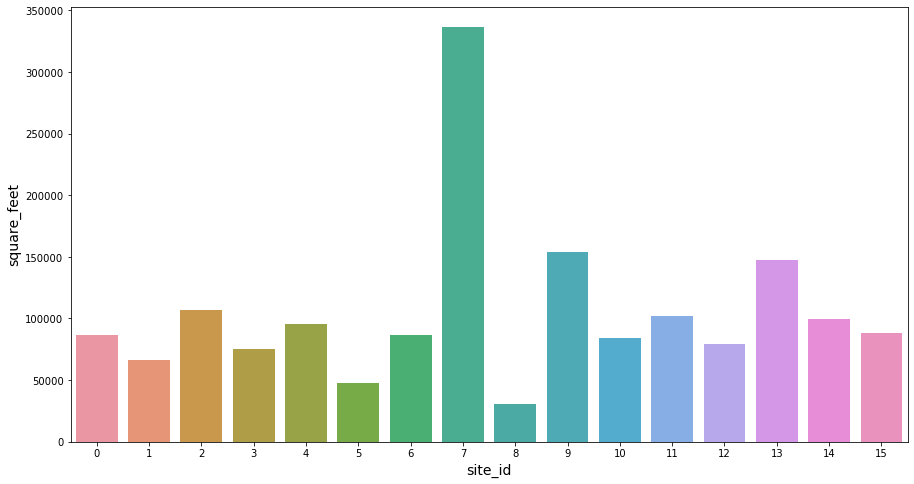

In [88]:
df = train[['site_id', 'square_feet']]
sites = list(range(0,16,1))

sq_fts = []*train['site_id'].nunique()
for i in range(train['site_id'].nunique()):
    area = df[df['site_id'] == i]['square_feet'].mean()
    sq_fts.append(area)
    
area_df = pd.DataFrame({'site_id': sites, 'square_feet': sq_fts})

fig = plt.figure(figsize=(15,8))
ax = sns.barplot(x='site_id', y='square_feet', data=area_df)
ax.set_xlabel('site_id', fontsize=14)
ax.set_ylabel('square_feet', fontsize=14)
plt.show()

## primary_use

In [49]:
train_use_count = train['primary_use'].value_counts()
train_use_per = train_use_count/train['primary_use'].count()
use_train = pd.concat([train_use_count, train_use_per], axis=1, keys=['Total','Percent']).reset_index()
use_train = use_train.rename(columns = {'index': 'primary_use'})
use_train

,primary_use,Total,Percent
0,Education,8165504,0.403911
1,Office,4394864,0.217394
2,Entertainment/public assembly,2264917,0.112035
3,Lodging/residential,2146413,0.106173
4,Public services,1662826,0.082253
5,Healthcare,398527,0.019713
6,Other,242222,0.011982
7,Parking,213796,0.010576
8,Manufacturing/industrial,125713,0.006218
9,Food sales and service,114090,0.005644


In [50]:
fig = px.pie(use_train, values='Percent', names='primary_use')
fig.show()

In [51]:
train_use_consumption = train[['primary_use', 'meter_reading']]
use_list = train['primary_use'].value_counts().index.to_list()
readings = []*len(use_list)

for i in use_list:
    reading = train_use_consumption[train_use_consumption['primary_use'] == i]['meter_reading'].sum()
    readings.append(reading)

reading_percent = readings / train_use_consumption['meter_reading'].sum()
use_df = pd.DataFrame({'primary_use': use_list, 'total_meter_reading': readings, 'percent_meter_reading': reading_percent})

In [52]:
fig = px.pie(use_df, values='percent_meter_reading', names='primary_use')
fig.show()

## square_feet

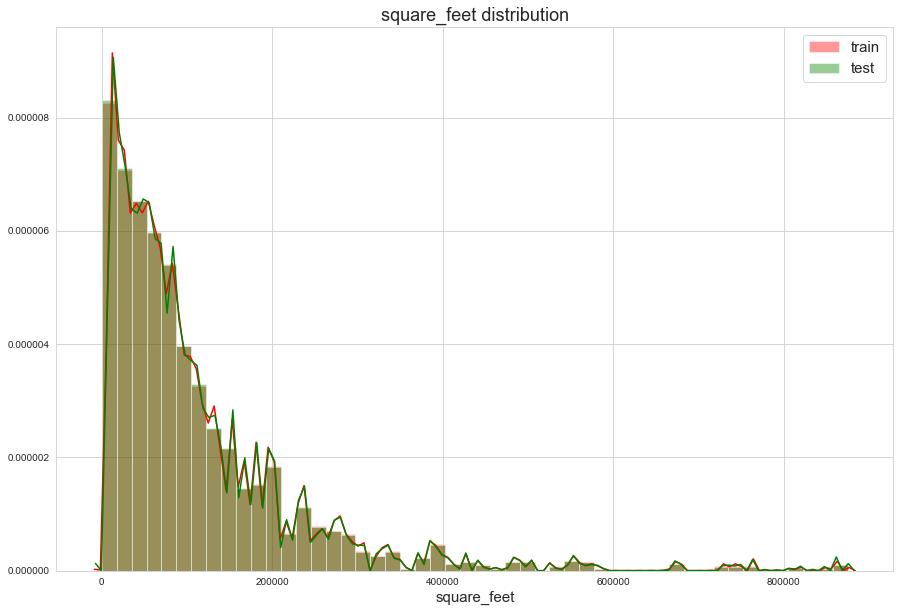

In [30]:
dist_plot('square_feet')

In [58]:
train.groupby('site_id')['square_feet', 'floor_count'].mean()

,square_feet,floor_count
site_id,,
0,86411.509331,NaN
1,65927.879047,6.921875
2,107127.861840,NaN
3,75146.897262,NaN
4,95214.353837,5.394531
5,47612.415730,2.281250
6,86764.852591,NaN
7,336180.920397,9.101562
8,30176.135099,1.014648


In [54]:
train.groupby('primary_use')['square_feet','floor_count'].mean()

,square_feet,floor_count
primary_use,,
Education,119998.782690,5.246094
Entertainment/public assembly,106256.004265,2.093750
Food sales and service,39635.179683,NaN
Healthcare,138438.671365,1.000000
Lodging/residential,100830.731729,6.382812
Manufacturing/industrial,42169.498739,1.666992
Office,96837.479905,3.851562
Other,29122.550755,1.067383
Parking,287217.872594,3.125000


## buliding_id

Text(0, 0.5, 'mean meter reading')

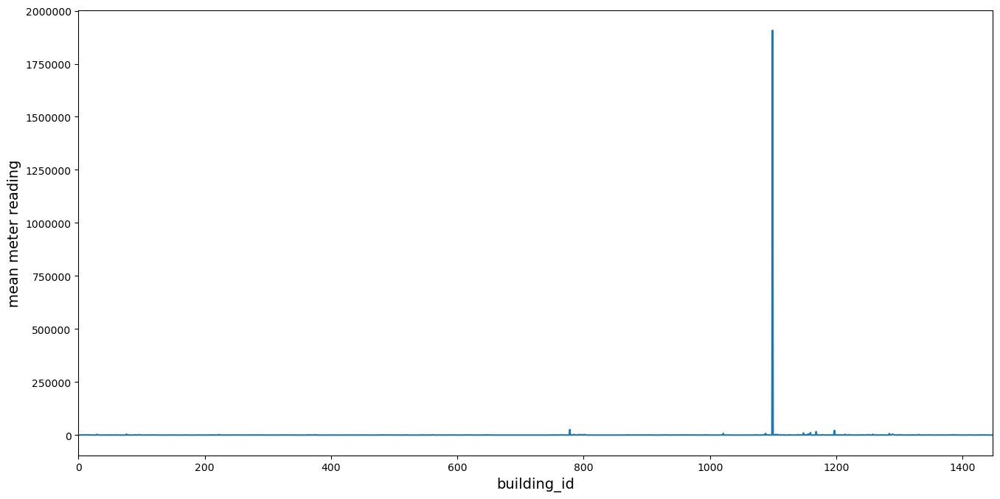

In [84]:
fig = plt.figure(figsize=(16,8), dpi=100)
ax = train.groupby('building_id')['meter_reading'].mean().plot()
ax.set_xlabel('building_id', fontsize=14)
ax.set_ylabel('mean meter reading', fontsize=14)

In [95]:
build_outlier = train.groupby('building_id')['meter_reading'].mean().idxmax()
train[train['building_id'] == build_outlier]

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
1533,1099,0,2016-01-01 00:00:00,2.822480e+02,13,Education,332884,NaN,NaN,-8.296875,8.0,-12.203125,NaN,1023.5,250.0,4.101562
1534,1099,2,2016-01-01 00:00:00,3.241630e+06,13,Education,332884,NaN,NaN,-8.296875,8.0,-12.203125,NaN,1023.5,250.0,4.101562
3829,1099,0,2016-01-01 01:00:00,2.822480e+02,13,Education,332884,NaN,NaN,-8.296875,NaN,-11.703125,-1.0,1023.5,240.0,4.101562
3830,1099,2,2016-01-01 01:00:00,3.241630e+06,13,Education,332884,NaN,NaN,-8.296875,NaN,-11.703125,-1.0,1023.5,240.0,4.101562
6125,1099,0,2016-01-01 02:00:00,2.848640e+02,13,Education,332884,NaN,NaN,-7.800781,NaN,-11.101562,-1.0,1023.0,240.0,3.099609
6126,1099,2,2016-01-01 02:00:00,2.625840e+05,13,Education,332884,NaN,NaN,-7.800781,NaN,-11.101562,-1.0,1023.0,240.0,3.099609
8424,1099,0,2016-01-01 03:00:00,2.802870e+02,13,Education,332884,NaN,NaN,-7.800781,NaN,-11.101562,-1.0,1022.5,250.0,4.101562
8425,1099,2,2016-01-01 03:00:00,2.263200e+04,13,Education,332884,NaN,NaN,-7.800781,NaN,-11.101562,-1.0,1022.5,250.0,4.101562
10719,1099,0,2016-01-01 04:00:00,2.799750e+02,13,Education,332884,NaN,NaN,-7.199219,NaN,-10.601562,0.0,1023.0,270.0,4.101562
10720,1099,2,2016-01-01 04:00:00,1.608960e+05,13,Education,332884,NaN,NaN,-7.199219,NaN,-10.601562,0.0,1023.0,270.0,4.101562


Text(0, 0.5, 'mean meter reading')

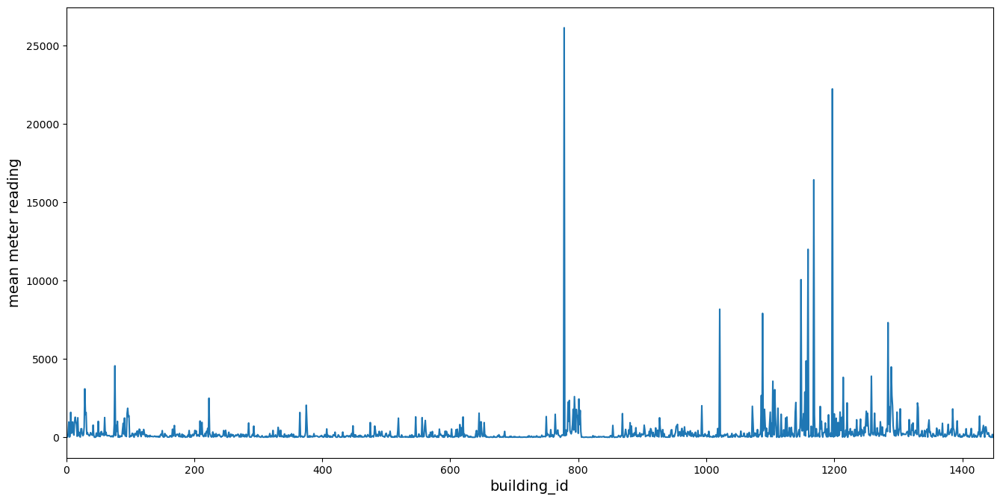

In [96]:
fig = plt.figure(figsize=(16,8), dpi=100)
ax = train[train['building_id'] != build_outlier].groupby('building_id')['meter_reading'].mean().plot()
ax.set_xlabel('building_id', fontsize=14)
ax.set_ylabel('mean meter reading', fontsize=14)

## floor_count

Text(0.5, 0, 'floor_count_test')

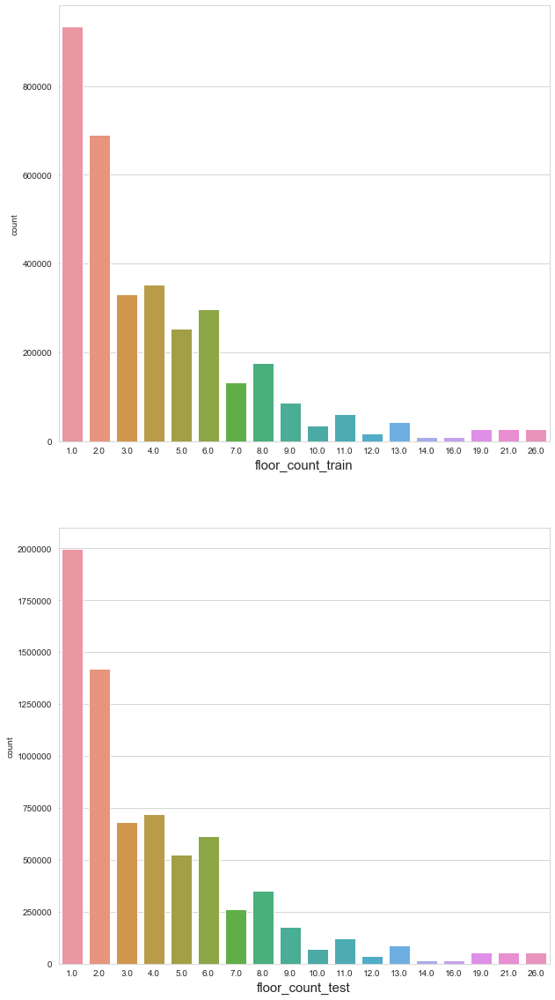

In [36]:
fig = plt.figure(figsize=(10,20))

ax1 = plt.subplot(2,1,1)
sns.countplot(x='floor_count', data = train)
ax1.set_xlabel('floor_count_train', fontsize=15)

ax2 = plt.subplot(2,1,2)
sns.countplot(x='floor_count', data = test)
ax2.set_xlabel('floor_count_test', fontsize=15)

Text(0, 0.5, 'mean_meter_reading')

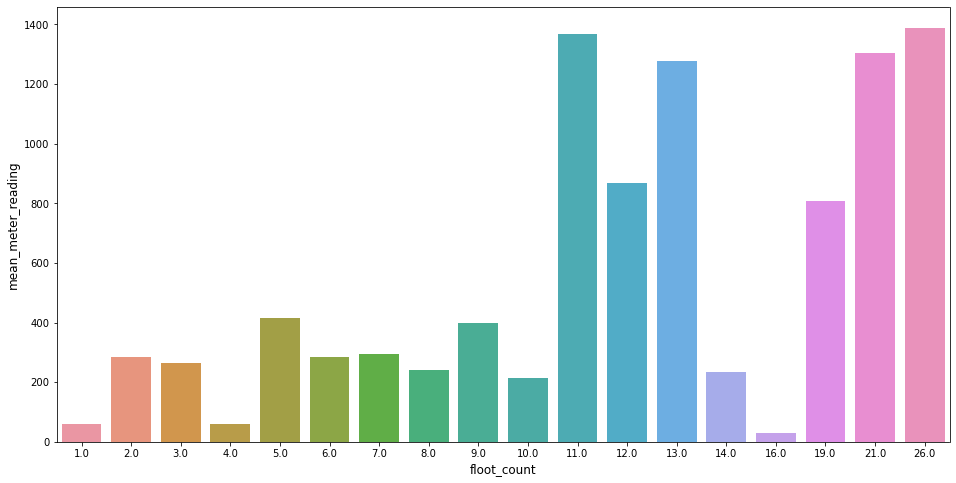

In [75]:
floor = train.groupby('floor_count')['meter_reading'].mean().sort_index()
floor_df = pd.DataFrame({'floor_count': floor.index, 'mean_meter_reading': floor.values})

fig = plt.figure(figsize=(16,8))
ax = sns.barplot(x='floor_count', y='mean_meter_reading', data=floor_df)
ax.set_xlabel('floot_count', fontsize=12)
ax.set_ylabel('mean_meter_reading', fontsize=12)


## year_built

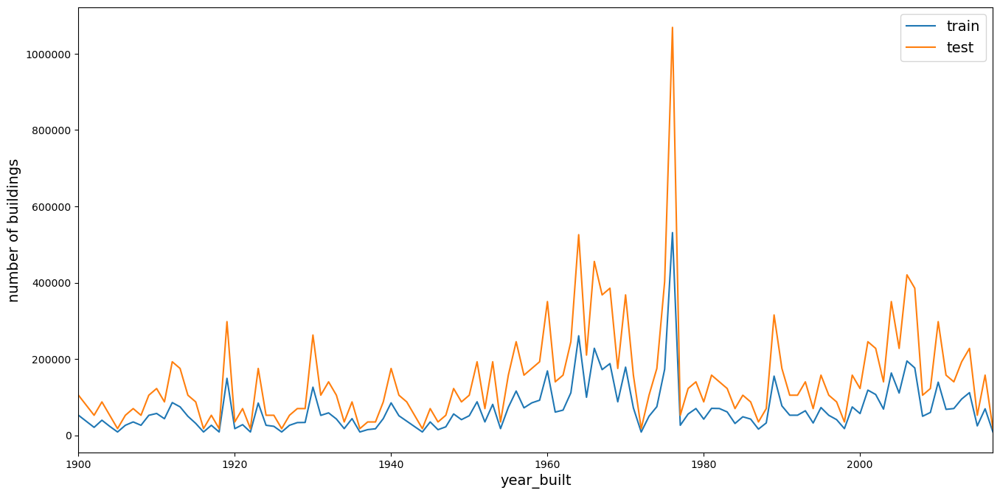

In [29]:
train_built = train['year_built'].value_counts(dropna=True).sort_index()
test_built = test['year_built'].value_counts(dropna=True).sort_index()

fig, ax = plt.subplots(1,1, figsize=(16,8), dpi=100)
train_built.plot(ax=ax)
test_built.plot(ax=ax)
ax.set_xlabel('year_built', fontsize=14)
ax.set_ylabel('number of buildings', fontsize=14)
ax.legend(['train', 'test'], fontsize=14)

Text(0.5, 1.0, 'Test')

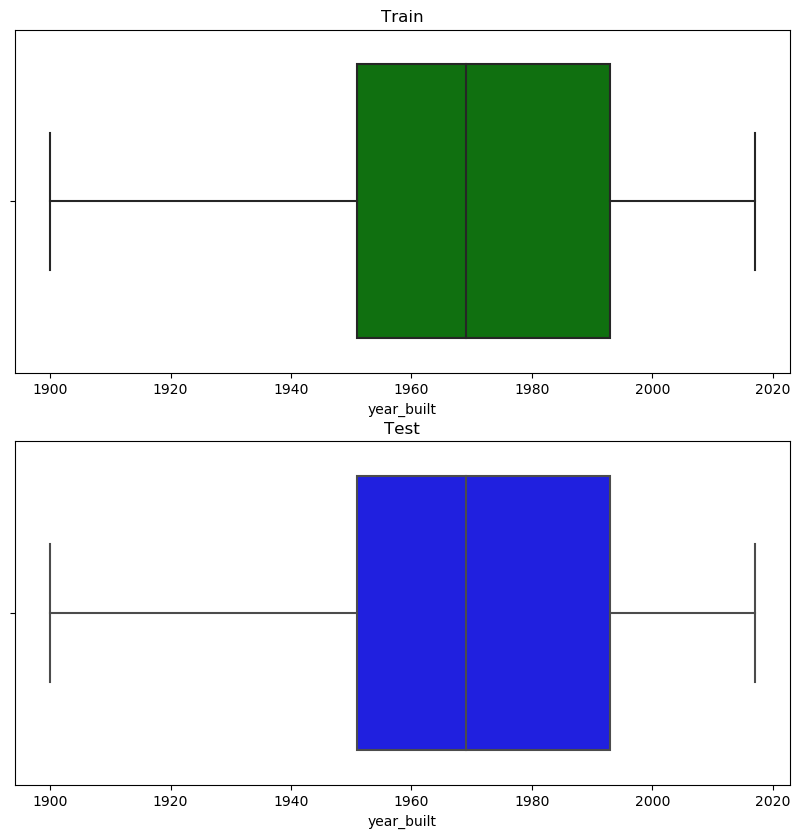

In [42]:
fig, axes = plt.subplots(2,1 ,figsize=(10,10), dpi=100)
sns.boxplot(x=train['year_built'], color='green', ax=axes[0])
sns.boxplot(x=test['year_built'], color='blue', ax=axes[1])
axes[0].set_title('Train', fontsize=12)
axes[1].set_title('Test', fontsize=12)

Text(0, 0.5, 'meter_reading')

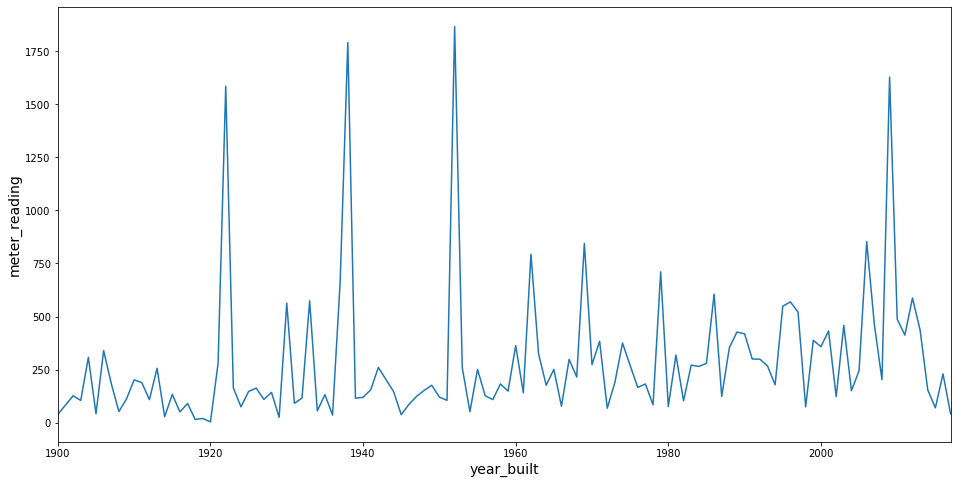

In [45]:
fig = plt.figure(figsize=(16,8))
ax = train.groupby('year_built')['meter_reading'].mean().plot()
ax.set_xlabel('year_built', fontsize=14)
ax.set_ylabel('meter_reading', fontsize=14)

## air_temperature

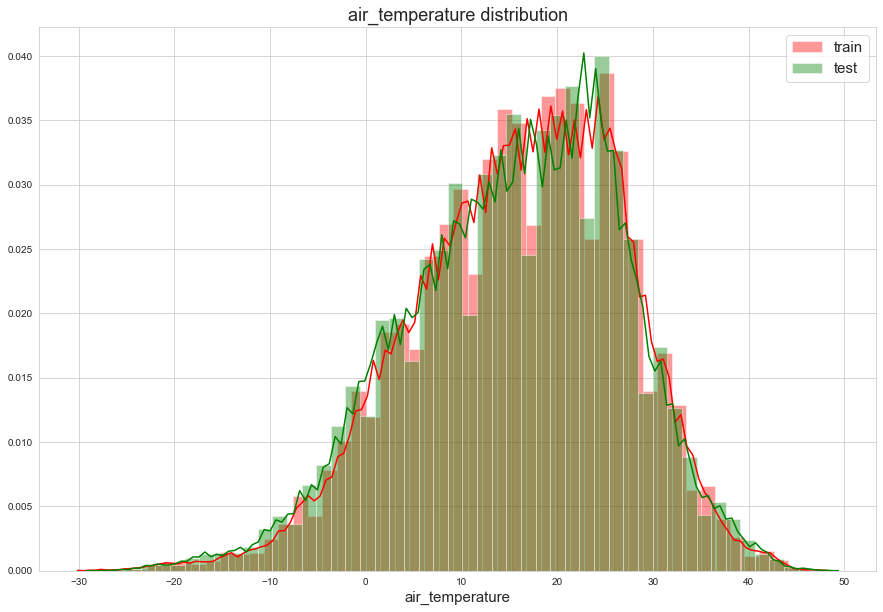

In [22]:
dist_plot('air_temperature')

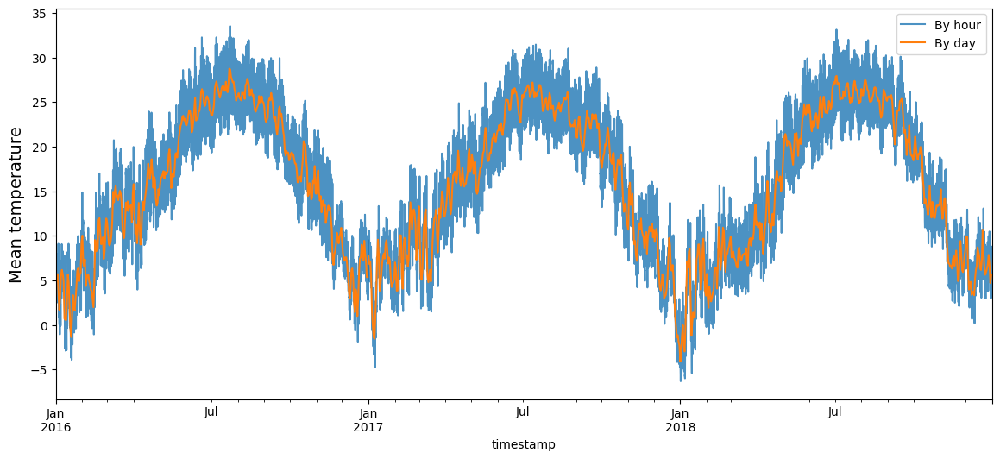

In [135]:
fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
train[['timestamp', 'air_temperature']].set_index('timestamp').resample('H').mean()['air_temperature'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean temperature', fontsize=14)
test[['timestamp', 'air_temperature']].set_index('timestamp').resample('H').mean()['air_temperature'].plot(ax=axes, alpha=0.8, color='tab:blue', label='')
train[['timestamp', 'air_temperature']].set_index('timestamp').resample('D').mean()['air_temperature'].plot(ax=axes, alpha=1, label='By day', color='tab:orange')
test[['timestamp', 'air_temperature']].set_index('timestamp').resample('D').mean()['air_temperature'].plot(ax=axes, alpha=1, color='tab:orange', label='')
axes.legend()


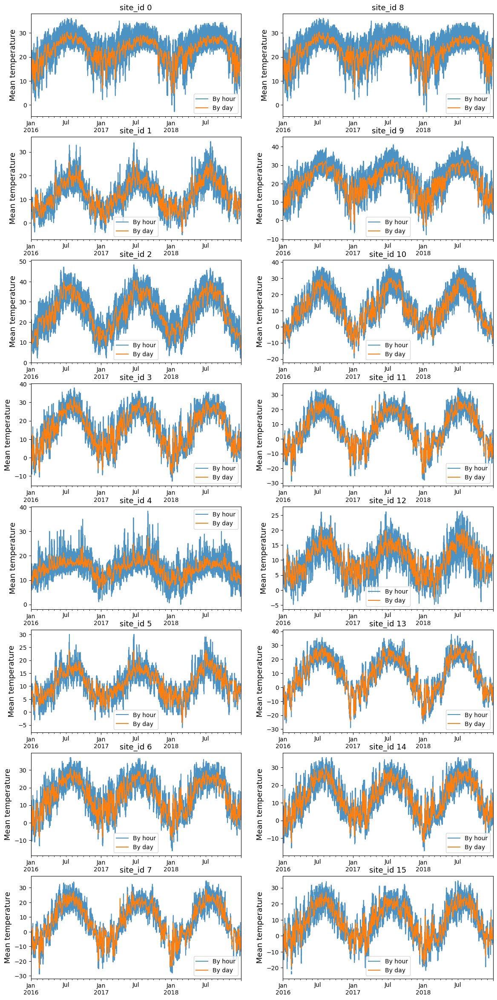

In [16]:
fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i in range(train['site_id'].nunique()):
    train[train['site_id'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('H').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean temperature', fontsize=13);
    test[test['site_id'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('H').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=0.8, color='tab:blue', label='').set_xlabel('')
    train[train['site_id'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('D').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange')
    test[test['site_id'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('D').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=1, color='tab:orange', label='').set_xlabel('')
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('site_id {}'.format(i), fontsize=13);

http://ww2010.atmos.uiuc.edu/(Gh)/guides/maps/sfcobs/dwp.rxml 

## cloud_coverage

In [100]:
train['cloud_coverage'].value_counts().sort_index()

0.0    5752501
1.0      25653
2.0    2431126
3.0      21866
4.0    1844497
5.0      18923
6.0     548557
7.0     125319
8.0     548105
9.0      74188
Name: cloud_coverage, dtype: int64

Text(0, 0.5, 'mean_meter_reading')

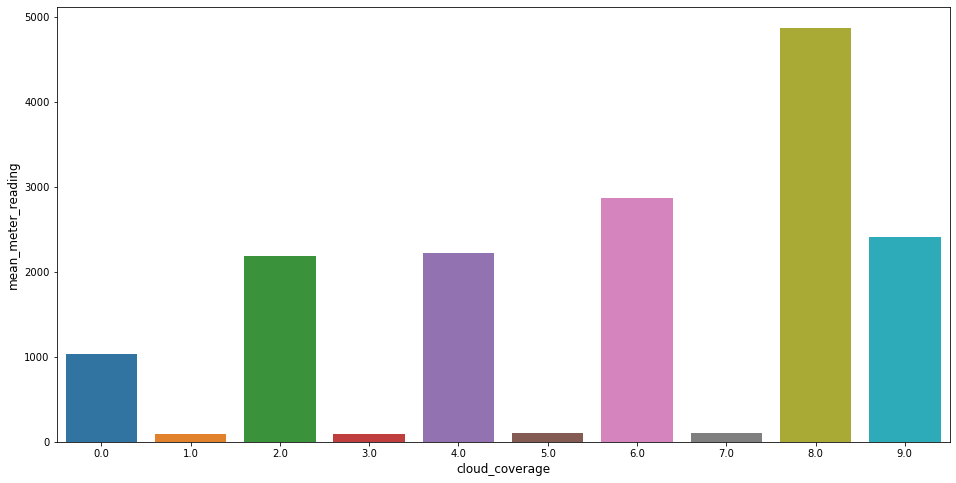

In [103]:
cloud = train.groupby('cloud_coverage')['meter_reading'].mean().sort_index()
cloud_df = pd.DataFrame({'cloud_coverage': cloud.index, 'mean_meter_reading': cloud.values})

fig = plt.figure(figsize=(16,8))
ax = sns.barplot(x='cloud_coverage', y='mean_meter_reading', data=cloud_df)
ax.set_xlabel('cloud_coverage', fontsize=12)
ax.set_ylabel('mean_meter_reading', fontsize=12)

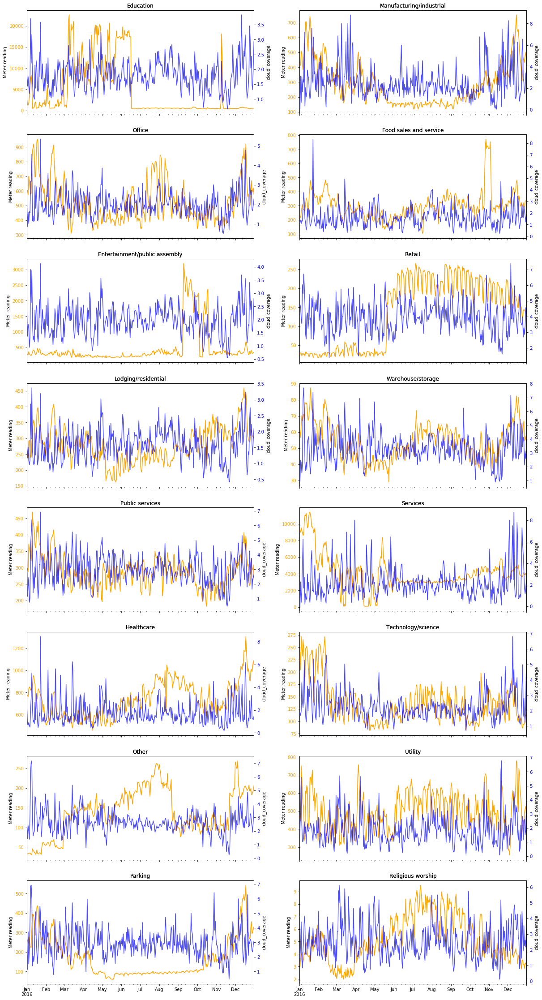

In [44]:
fig, axes = plt.subplots(8,2, figsize=(20,40))
axes2 = axes

for i, prim_use in enumerate(train['primary_use'].value_counts().index.to_list()):
    D = train[train['primary_use'] == prim_use][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    D.plot(ax=axes[i%8][i//8], label='meter_reading', alpha=1, color='orange')
    axes[i%8][i//8].set_title('{}' .format(prim_use))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('Meter reading')
    axes[i%8][i//8].tick_params(axis='y', labelcolor='orange')
    
    axes2[i%8][i//8] = axes[i%8][i//8].twinx()
    cld_cov = train[train['primary_use'] == prim_use][['timestamp', 'cloud_coverage']].set_index('timestamp').resample('D').mean()['cloud_coverage']
    cld_cov.plot(ax=axes2[i%8][i//8], label='cloud_coverage', alpha=0.7, color='blue')
    axes2[i%8][i//8].set_title('{}' .format(prim_use))
    axes2[i%8][i//8].set_xlabel('')
    axes2[i%8][i//8].set_ylabel('cloud_coverage')
    axes2[i%8][i//8].tick_params(axis='y', labelcolor='blue')
    


### investigate if cloud coverage affects bulidings with primary_use as "Manufacturing/industrial" and "Utility"

## precip_depth_1_hr

http://anzasca.net/wp-content/uploads/2015/12/005_Diaz-Sandoval_Osmond_King_ASA2015.pdf 

https://nrc-publications.canada.ca/eng/view/accepted/?id=b3873340-8c0a-472c-a9be-9d793be7cb2e

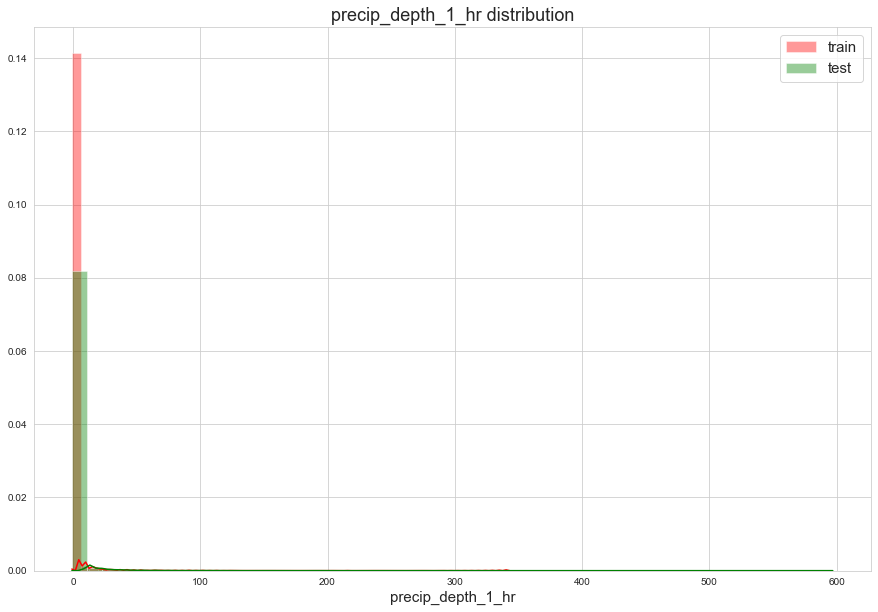

In [25]:
dist_plot('precip_depth_1_hr')

In [85]:
train.query('precip_depth_1_hr >= 20').shape[0]/train.query('precip_depth_1_hr < 20').shape[0]

0.011530484475810118

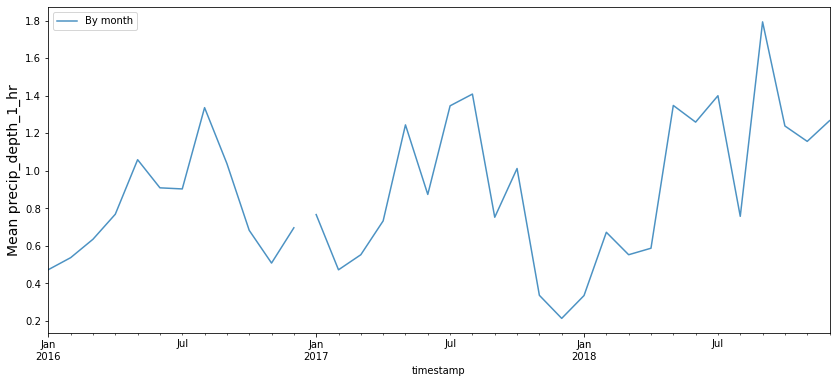

In [54]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
train[['timestamp', 'precip_depth_1_hr']].set_index('timestamp').resample('M').mean()['precip_depth_1_hr'].plot(ax=axes, alpha=0.8, label='By month', color='tab:blue').set_ylabel('Mean precip_depth_1_hr', fontsize=14)
test[['timestamp', 'precip_depth_1_hr']].set_index('timestamp').resample('M').mean()['precip_depth_1_hr'].plot(ax=axes, alpha=0.8, color='tab:blue', label='');
axes.legend()

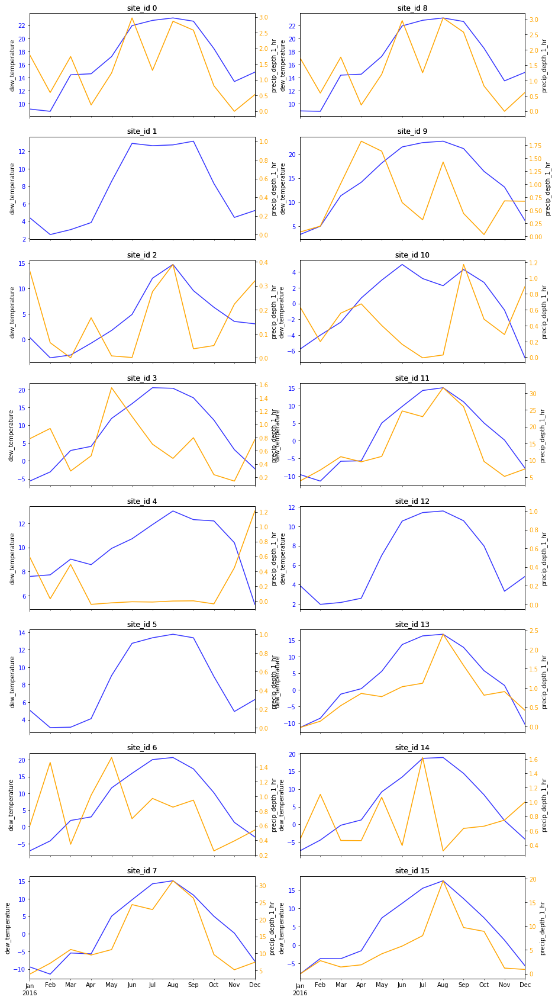

In [61]:
fig, axes = plt.subplots(8,2, figsize=(15,30))
axes2 = axes
for i in range(train['site_id'].nunique()):
    dew = train[train['site_id'] == i][['timestamp', 'dew_temperature']].set_index('timestamp').resample('M').mean()['dew_temperature']
    dew.plot(ax=axes[i%8][i//8], label='dew_temperature', alpha=0.8, color='blue')
    axes[i%8][i//8].set_title('site_id {}' .format(i))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('dew_temperature')
    axes[i%8][i//8].tick_params(axis='y', labelcolor='blue')

    axes2[i%8][i//8] = axes[i%8][i//8].twinx()
    precip = train[train['site_id'] == i][['timestamp', 'precip_depth_1_hr']].set_index('timestamp').resample('M').mean()['precip_depth_1_hr']
    precip.plot(ax=axes2[i%8][i//8], label='precip_depth_1_hr', alpha=1, color='orange')
    axes2[i%8][i//8].set_title('site_id {}' .format(i))
    axes2[i%8][i//8].set_xlabel('')
    axes2[i%8][i//8].set_ylabel('precip_depth_1_hr')
    axes2[i%8][i//8].tick_params(axis='y', labelcolor='orange')

## dew_temperature

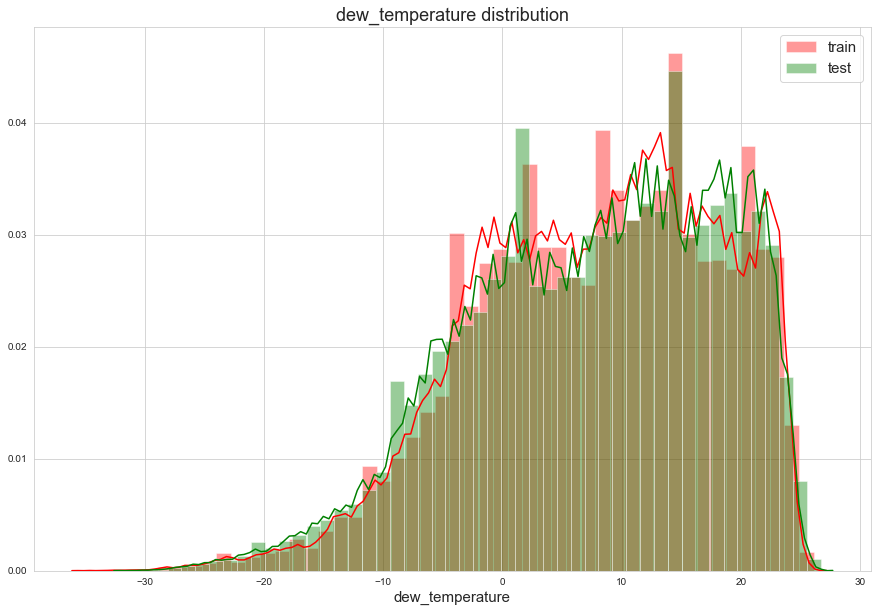

In [24]:
dist_plot('dew_temperature')

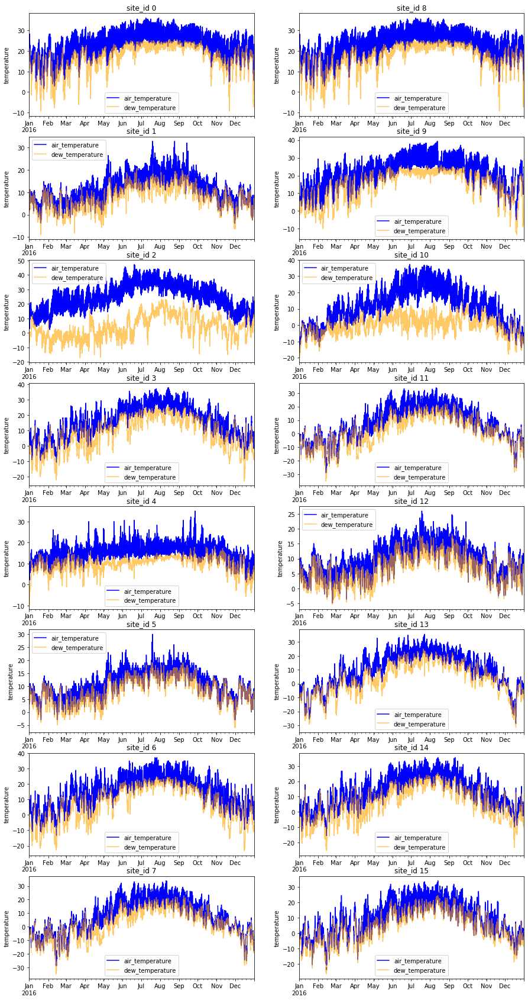

In [22]:
fig, axes = plt.subplots(8,2, figsize=(15,30))
for i in range(train['site_id'].nunique()):
    air_temp = train[train['site_id'] == i][['timestamp', 'air_temperature']].set_index('timestamp').resample('H').mean()['air_temperature']
    air_temp.plot(ax=axes[i%8][i//8], label='air_temperature', alpha=1, color='blue')
    dew = train[train['site_id'] == i][['timestamp', 'dew_temperature']].set_index('timestamp').resample('H').mean()['dew_temperature']
    dew.plot(ax=axes[i%8][i//8], label='dew_temperature', alpha=0.6, color='orange')
    axes[i%8][i//8].set_title('site_id {}' .format(i))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('temperature')
    axes[i%8][i//8].tick_params(axis='y')
    axes[i%8][i//8].legend()
    

## sea_level_pressure

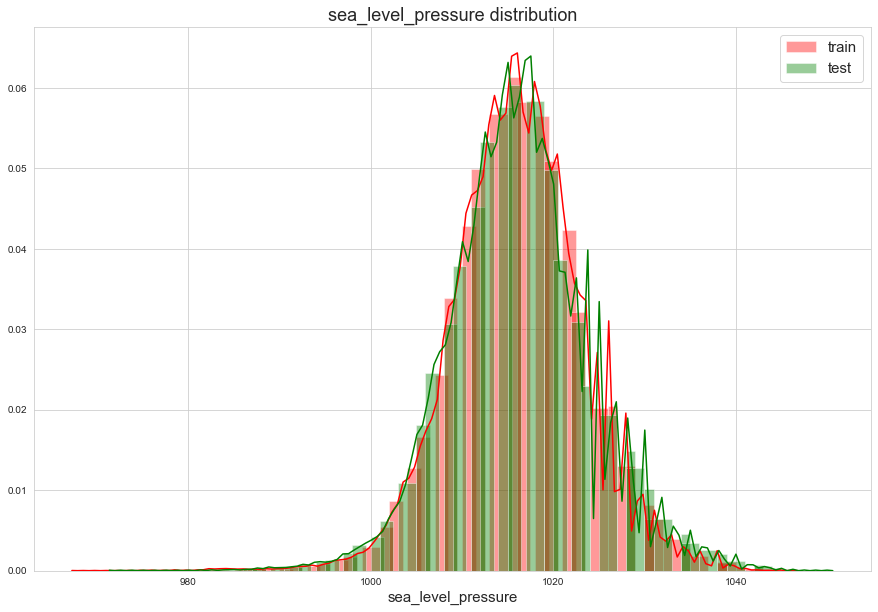

In [26]:
dist_plot('sea_level_pressure')

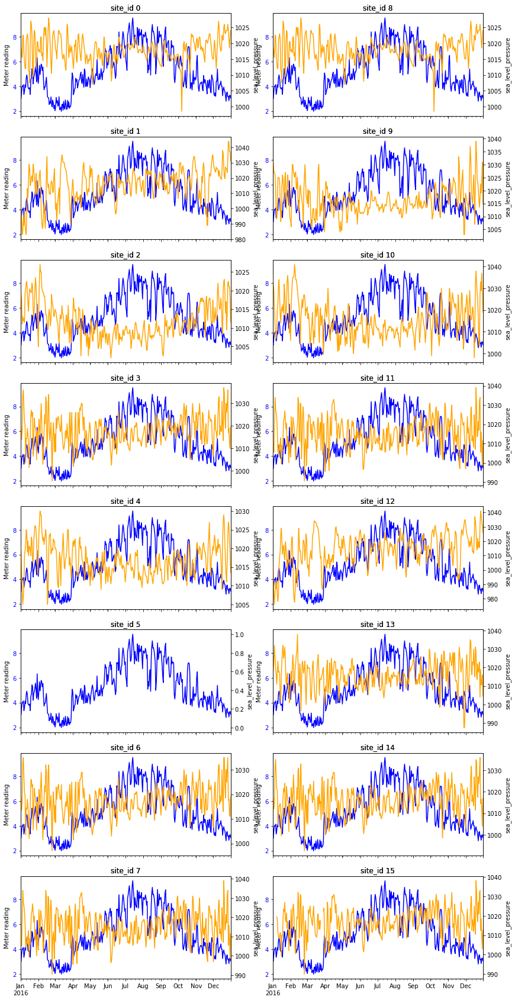

In [66]:
fig, axes = plt.subplots(8,2,figsize=(14, 30))
axes2 = axes
for i in range(train['site_id'].nunique()):
    D = train[train['primary_use'] == prim_use][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    D.plot(ax=axes[i%8][i//8], label='meter_reading', alpha=1, color='blue')
    axes[i%8][i//8].set_title('site_id {}'.format(i))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('Meter reading')
    axes[i%8][i//8].tick_params(axis='y', labelcolor='blue')
    
    axes2[i%8][i//8] = axes[i%8][i//8].twinx()
    s_lv_pr = train[train['site_id'] == i][['timestamp', 'sea_level_pressure']].set_index('timestamp').resample('D').mean()['sea_level_pressure']
    s_lv_pr.plot(ax=axes2[i%8][i//8], alpha=1, label='sea_level_presure', color='orange')
    axes2[i%8][i//8].set_ylabel('sea_level_pressure')
    axes2[i%8][i//8].set_title('site_id {}'.format(i))

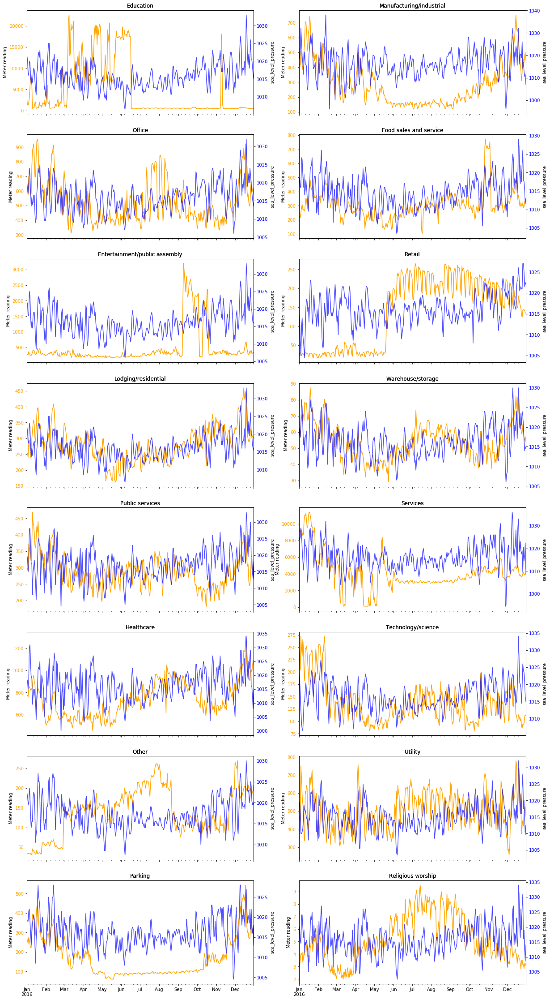

In [67]:
fig, axes = plt.subplots(8,2, figsize=(20,40))
axes2 = axes

for i, prim_use in enumerate(train['primary_use'].value_counts().index.to_list()):
    D = train[train['primary_use'] == prim_use][['timestamp', 'meter_reading']].set_index('timestamp').resample('D').mean()['meter_reading']
    D.plot(ax=axes[i%8][i//8], label='meter_reading', alpha=1, color='orange')
    axes[i%8][i//8].set_title('{}' .format(prim_use))
    axes[i%8][i//8].set_xlabel('')
    axes[i%8][i//8].set_ylabel('Meter reading')
    axes[i%8][i//8].tick_params(axis='y', labelcolor='orange')
    
    axes2[i%8][i//8] = axes[i%8][i//8].twinx()
    s_lv_pr = train[train['primary_use'] == prim_use][['timestamp', 'sea_level_pressure']].set_index('timestamp').resample('D').mean()['sea_level_pressure']
    s_lv_pr.plot(ax=axes2[i%8][i//8], label='sea_level_pressure', alpha=0.7, color='blue')
    axes2[i%8][i//8].set_title('{}' .format(prim_use))
    axes2[i%8][i//8].set_xlabel('')
    axes2[i%8][i//8].set_ylabel('sea_level_pressure')
    axes2[i%8][i//8].tick_params(axis='y', labelcolor='blue')

## wind_direction and wind_speed

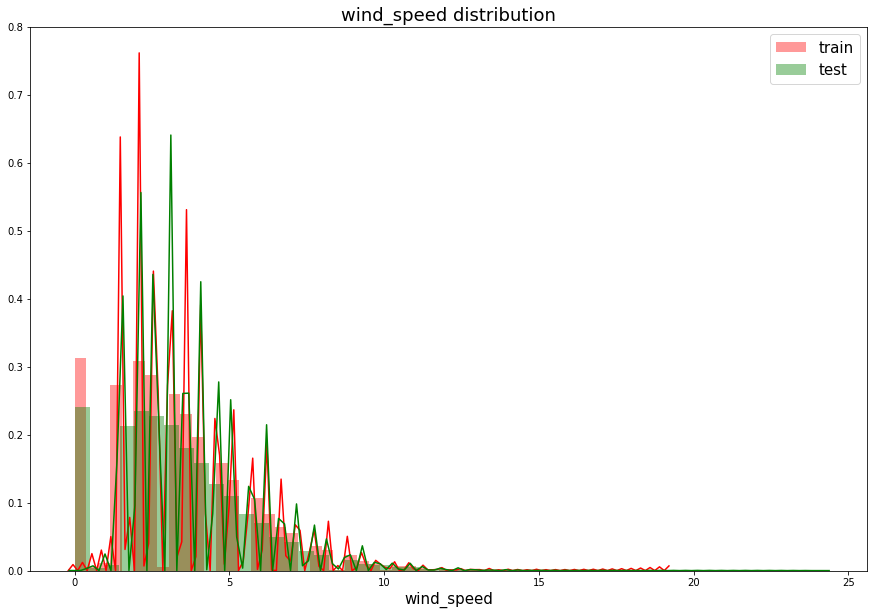

In [62]:
dist_plot('wind_speed')

Visualization of wind_speed and wind_direction will be done using material from <a href="https://gist.github.com/phobson/41b41bdd157a2bcf6e14">this guide</a>

 

In [97]:
def speed_labels(bins:list, units:str) -> list:   
    labels = list()
    for left, right in zip(bins[:-1], bins[1:]):
        if left == bins[0]:
            labels.append('calm'.format(right))
        elif np.isinf(right):
            labels.append('>{} {}'.format(left, units))
        else:
            labels.append('{} - {} {}'.format(left, right, units))
    return labels

def _convert_dir(directions, N=None):
    if N is None:
        N = directions.shape[0]
    barDir = directions * np.pi/180. - np.pi/N
    barWidth = 2 * np.pi / N
    return barDir, barWidth

spd_bins = [-1, 0, 5, 10, 15, 20, 25, 30, np.inf]
spd_labels = speed_labels(spd_bins, units='m/s')

dir_bins = np.arange(-7.5, 370, 15)
dir_labels = (dir_bins[:-1] + dir_bins[1:]) / 2



def wind_rose(rosedata, wind_dirs, palette=None):
    if palette is None:
        palette = sns.color_palette('inferno', n_colors=rosedata.shape[1])

    bar_dir, bar_width = _convert_dir(wind_dirs)

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
    ax.set_theta_direction('clockwise')
    ax.set_theta_zero_location('N')

    for n, (c1, c2) in enumerate(zip(rosedata.columns[:-1], rosedata.columns[1:])):
        if n == 0:
            # first column only
            ax.bar(bar_dir, rosedata[c1].values, 
                   width=bar_width,
                   color=palette[0],
                   edgecolor='none',
                   label=c1,
                   linewidth=0)

        # all other columns
        ax.bar(bar_dir, rosedata[c2].values, 
               width=bar_width, 
               bottom=rosedata.cumsum(axis=1)[c1].values,
               color=palette[n+1],
               edgecolor='none',
               label=c2,
               linewidth=0)

    leg = ax.legend(loc=(0.75, 0.95), ncol=2)
    xtl = ax.set_xticklabels(['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'])
    
    return fig


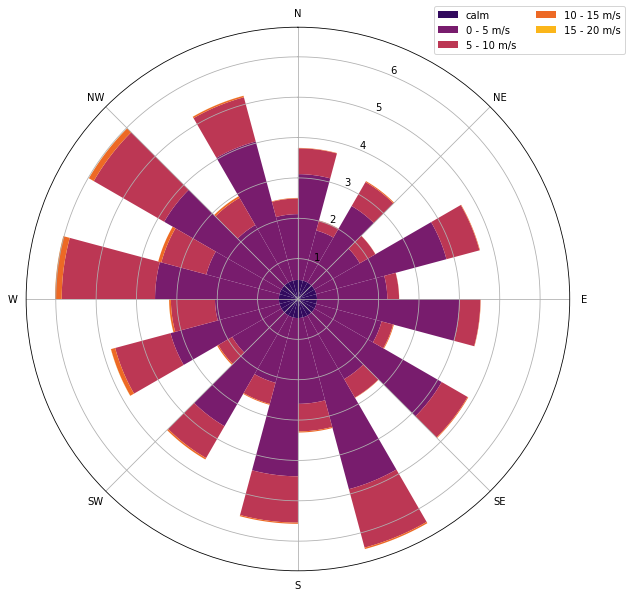

In [103]:
rose = (train.assign(WindSpd_bins=lambda df:
            pd.cut(df['wind_speed'], bins=spd_bins, labels=spd_labels, right=True)).assign(WindDir_bins=lambda df: pd.cut(df['wind_direction'], bins=dir_bins, labels=dir_labels, right=False)).replace({'WindDir_bins': {360: 0}}).groupby(by=['WindSpd_bins', 'WindDir_bins']).size().unstack(level='WindSpd_bins').fillna(0).assign(calm=lambda df: calm_count / df.shape[0]).sort_index(axis=1).applymap(lambda x: x / total_count * 100))
rose.drop(rose.index[0], inplace=True)
directions = np.arange(0, 360, 15)


fig = wind_rose(rose, directions)

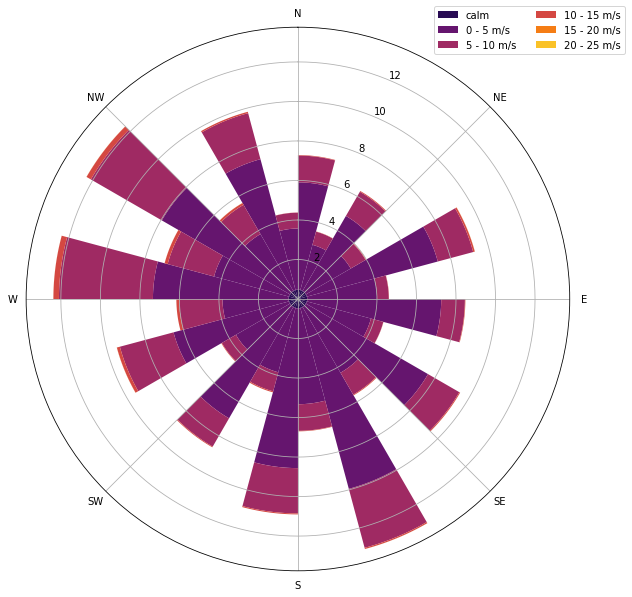

In [104]:
rose = (test.assign(WindSpd_bins=lambda df:
            pd.cut(df['wind_speed'], bins=spd_bins, labels=spd_labels, right=True)).assign(WindDir_bins=lambda df: pd.cut(df['wind_direction'], bins=dir_bins, labels=dir_labels, right=False)).replace({'WindDir_bins': {360: 0}}).groupby(by=['WindSpd_bins', 'WindDir_bins']).size().unstack(level='WindSpd_bins').fillna(0).assign(calm=lambda df: calm_count / df.shape[0]).sort_index(axis=1).applymap(lambda x: x / total_count * 100))
rose.drop(rose.index[0], inplace=True)
directions = np.arange(0, 360, 15)


fig = wind_rose(rose, directions)

In [123]:
## pickle train and test dataframes as backup
train.to_pickle('train.pkl')
test.to_pickle('test.pkl')

# Missing Variables

In [23]:
train_miss = train.isnull().sum().sort_values(ascending=False)
train_miss_per = (train.isnull().sum()/train.isnull().count()*100).sort_values(ascending=False)
missing_train = pd.concat([train_miss, train_miss_per], axis=1, keys=['Total','Percent'])
missing_train

,Total,Percent
floor_count,16709167,82.652772
year_built,12127645,59.990033
cloud_coverage,8825365,43.655131
precip_depth_1_hr,3749023,18.544739
wind_direction,1449048,7.167792
sea_level_pressure,1231669,6.092515
wind_speed,143676,0.710701
dew_temperature,100140,0.495348
air_temperature,96658,0.478124
square_feet,0,0.000000


In [14]:
test_miss = test.isnull().sum().sort_values(ascending=False)
test_miss_per = (test.isnull().sum()/test.isnull().count()*100).sort_values(ascending=False)
missing_test = pd.concat([test_miss, test_miss_per], axis=1, keys=['Total','Percent'])
missing_test

,Total,Percent
floor_count,34444320,82.605042
year_built,24598080,58.991597
cloud_coverage,19542180,46.866438
precip_depth_1_hr,7801563,18.709861
wind_direction,2978663,7.143488
sea_level_pressure,2516826,6.035901
wind_speed,302089,0.724476
dew_temperature,260799,0.625453
air_temperature,221901,0.532167
square_feet,0,0.000000


https://www.kaggle.com/juejuewang/handle-missing-values-in-time-series-for-beginners 

For Time-Series specific imputation, there are the following methods: 
* Last observation carried forward (LCOF)
* Next observation carried forward (NOCB)
* Linear interpolation
* Spline interpolation 

These methods rely on the assumption that adjacent observations are similar to each other. They do not work well when this assumption is not valid, especially when there is presence of strong seasonality. 

Should drop or impute missing variable manually to increase reliability of data and ease of model building

The top three features with large numbers of missing values are "floor_count", "year_built", and "cloud"coverage"
* "floor_count" has the majority of non-null values as either 1 or 2. However, ~82% of values are missing, so we cannot confidently impute them manually. Will be dropped 
* The same logic can be applied to "year_built," even though the average number of buildings built per year has increased sometime during the 1950s. Will be dropped

"cloud_coverage" and "sea_level_pressure" have little to no concrete scientific evidence of determining energy consumption in buildings. Will be dropped 


In [2]:
train = pd.read_pickle('train.pkl')
test = pd.read_pickle('test.pkl')

In [3]:
train.drop(['floor_count', 'year_built', 'cloud_coverage', 'sea_level_pressure'], axis=1, inplace=True)
test.drop(['floor_count', 'year_built', 'cloud_coverage', 'sea_level_pressure'], axis=1, inplace=True)

# Feature Engineering

## Relative Humidity 

https://mrelectric.com/blog/the-relationship-between-weather-and-energy-usage

https://iridl.ldeo.columbia.edu/dochelp/QA/Basic/dewpoint.html 

assuming that air_temperature is the ambient temperature and

Td = dew_temperature, T = air_temperature, RH = relative humidity

$Td = T - ((100-RH)/5)$

 => $RH = 100 - ((T-Td)*5$



In [4]:
train['relative_humidity'] = 100 - ((train['air_temperature'] -  
                                     train['dew_temperature'])*5)
test['relative_humidity'] = 100 - ((test['air_temperature'] -  
                                     test['dew_temperature'])*5)

## Encoding primary_use
Need to transform this categorical variable into a numeric variable

In [5]:
le = preprocessing.LabelEncoder()
train['primary_use'] = le.fit_transform(train['primary_use']).astype(np.int8)

test['primary_use'] = le.fit_transform(test['primary_use']).astype(np.int8)

## Introduce datetime features "hour" and "day"
Separating time components further breaks the "timestamp" variable down and provides more regressors to our ML model

In [6]:
train['hour'] = train['timestamp'].dt.hour
train['day'] = train['timestamp'].dt.day
train['month'] = train['timestamp'].dt.month

test['hour'] = test['timestamp'].dt.hour
test['day'] = test['timestamp'].dt.day
test['month'] = test['timestamp'].dt.month

## Dropping time_stamp now that we have multiple datetime features

In [7]:
train = train.drop(['timestamp'], axis=1)
test = test.drop(['timestamp'], axis=1)

## Dropping building_id
This variable may cause the ML model to overfit 

In [8]:
train = train.drop(['building_id'], axis=1)
test = test.drop(['building_id'], axis=1)

# LightGBM

## LightGBM Basic Regression Model

In [9]:
target = train['meter_reading']
train = train.drop(['meter_reading'], axis=1)

In [251]:
seed = 42 
X_train, X_test, y_train, y_test = train_test_split(train, 
                                                    target, 
                                                    test_size=0.50, 
                                                    random_state=seed)

categoricals = ['meter', 'site_id', 'primary_use', 'hour', 'day', 'wind_direction']

train_set = lgb.Dataset(X_train, y_train, categorical_feature=categoricals)
test_set = lgb.Dataset(X_test, y_test, categorical_feature=categoricals)

In [252]:
params = {
    'objective': 'regression',
    'boosting': 'gbdt',
    'learning_rate': 0.3,
    'num_leaves': 200,
    'feature_fraction': 0.85,
    'lambda_l1': 1,
    'lambda_l2': 1,
    'metric': 'rmse'
}

model = lgb.train(params, 
                  train_set=train_set, 
                  num_boost_round=500, 
                  verbose_eval=100,
                  early_stopping_rounds=100, 
                  valid_sets=(train_set, test_set))

C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 10431	valid_1's rmse: 42147.7
[200]	training's rmse: 6595.16	valid_1's rmse: 41800.5
[300]	training's rmse: 4770.83	valid_1's rmse: 41743.7
[400]	training's rmse: 3923.62	valid_1's rmse: 41685.8
[500]	training's rmse: 3480.62	valid_1's rmse: 41681.8
Did not meet early stopping. Best iteration is:
[500]	training's rmse: 3480.62	valid_1's rmse: 41681.8


Training did not meet early stopping criteria, and the training data and valid set's RMSEs are high. This means that the model has much to improve on

## Feature Importance

In [253]:
imp_df = pd.DataFrame({'Feature': X_train.columns.values, 
                       'Importance': model.feature_importance()})
imp_df = imp_df.sort_values(by='Importance', 
                            ascending=False).reset_index(drop=True)

Text(0.5, 1.0, 'LightGBM Feature Importance \n')

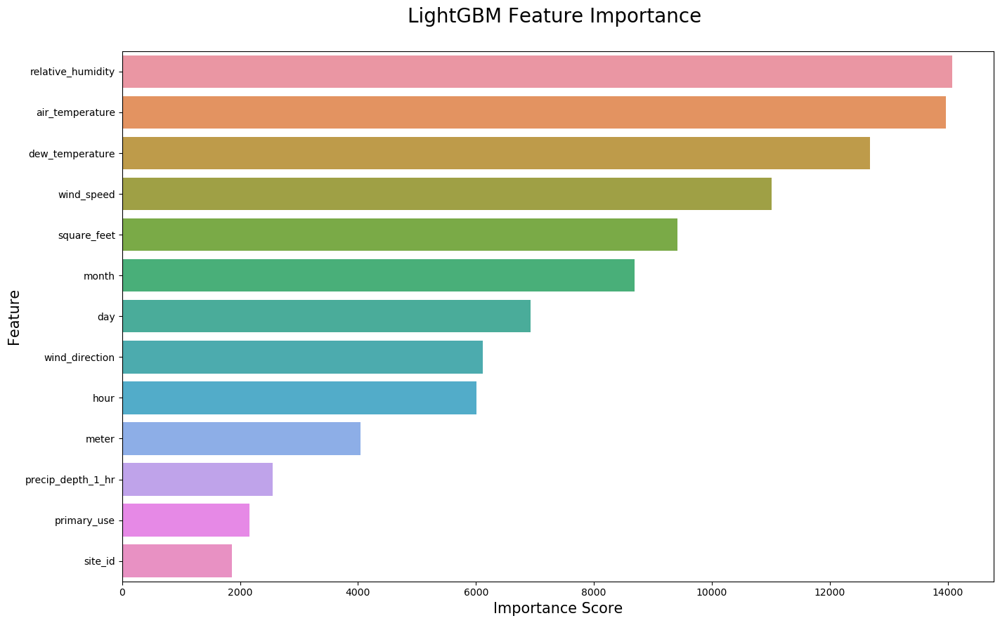

In [254]:
plt.figure(figsize=(16,10), dpi=100) 
ax1 = sns.barplot(x='Importance', y='Feature', data=imp_df)
ax1.set_xlabel('Importance Score', fontsize=15)
ax1.set_ylabel('Feature', fontsize=15)
ax1.set_title('LightGBM Feature Importance \n', fontsize=20)

## LightGBM using KFold cross-validation

In [258]:
folds = KFold(n_splits=5, shuffle=True, random_state=seed)
models = []
for train_index, val_index in folds.split(train):
    X_train = train.iloc[train_index]
    X_val = train.iloc[val_index]
    y_train = target.iloc[train_index]
    y_val = target.iloc[val_index]
    
    train_set = lgb.Dataset(X_train, y_train, categorical_feature=categoricals)
    eval_set = lgb.Dataset(X_val, y_val, categorical_feature=categoricals)
    
    indv_model = lgb.train(params, 
                  train_set=train_set, 
                  num_boost_round=500, 
                  verbose_eval=100,
                  early_stopping_rounds=100, 
                  valid_sets=(train_set, eval_set))
    
    models.append(indv_model)

C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 11280.1	valid_1's rmse: 35858.4
[200]	training's rmse: 7920.27	valid_1's rmse: 35293
[300]	training's rmse: 5828.42	valid_1's rmse: 35202.5
Early stopping, best iteration is:
[298]	training's rmse: 5840.3	valid_1's rmse: 35202.2


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 11370.5	valid_1's rmse: 37561.3
[200]	training's rmse: 7481.85	valid_1's rmse: 37351.8
Early stopping, best iteration is:
[172]	training's rmse: 8031.58	valid_1's rmse: 37296.1


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 11867	valid_1's rmse: 30825.6
[200]	training's rmse: 8362.25	valid_1's rmse: 30722.3
Early stopping, best iteration is:
[146]	training's rmse: 10235.2	valid_1's rmse: 30691.5


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 12534.4	valid_1's rmse: 34904.2
[200]	training's rmse: 8244.81	valid_1's rmse: 34419.4
[300]	training's rmse: 5870.52	valid_1's rmse: 34341.7
[400]	training's rmse: 4817.3	valid_1's rmse: 34272.4
[500]	training's rmse: 4269.05	valid_1's rmse: 34234.8
Did not meet early stopping. Best iteration is:
[500]	training's rmse: 4269.05	valid_1's rmse: 34234.8


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 13306	valid_1's rmse: 35769.3
[200]	training's rmse: 9682.3	valid_1's rmse: 35302.3
[300]	training's rmse: 8106.03	valid_1's rmse: 35282.3
[400]	training's rmse: 6849.56	valid_1's rmse: 35323.9
Early stopping, best iteration is:
[317]	training's rmse: 7814.45	valid_1's rmse: 35269.3


KFold cross-validation does not seem to improve the model's performance on rmse. Maybe chosen values for hyperparameters are not ideal for this dataset

## Hyperparameter Tuning
With lots of data, using GridSearch may not be the fastest or most efficient option.

Let's try __Bayesian Optimization__

I will use <a href="https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html">this guide</a> and <a href="https://neptune.ai/blog/lightgbm-parameters-guide">this manual</a> for parameter selection and optimzation methodologies for LightGBM

I will use <a href="https://github.com/fmfn/BayesianOptimization">this guide</a> to learn how to use Bayesian Optimization



In [10]:
seed = 42 
X_train, X_test, y_train, y_test = train_test_split(train, 
                                                    target, 
                                                    test_size=0.40, 
                                                    random_state=seed)

categoricals = ['meter', 'site_id', 'primary_use', 'hour', 'day', 'wind_direction']

train_set = lgb.Dataset(X_train, y_train, categorical_feature=categoricals, free_raw_data=False)
val_set = lgb.Dataset(X_test, y_test, categorical_feature=categoricals, free_raw_data=False)

In [13]:
space = {
    'learning_rate': (0.005, 0.5),
    'num_leaves': (40, 500),
    'bagging_fraction': (0.1, 1),
    'feature_fraction': (0.1, 1),
    'max_depth': (1,20),
    'min_data_in_leaf': (10, 150),
    'lambda_l1': (0.1, 2),
    'lambda_l2': (0.1, 2)
}

def model_train(learning_rate,
               num_leaves,
               bagging_fraction,
               feature_fraction,
               max_depth,
               min_data_in_leaf,
               lambda_l1,
               lambda_l2):
    params = {'learning_rate': learning_rate,
             'num_leaves': int(num_leaves),
             'bagging_fraction': bagging_fraction,
             'feature_fraction': feature_fraction,
             'max_depth': int(max_depth),
             'min_data_in_leaf': int(min_data_in_leaf),
             'lambda_l1': lambda_l1,
             'lambda_l2': lambda_l2,
             'objective': 'regression',
             'boosting_type': 'gbdt',
             'random_state': 42,
             'verbose': 0,
             'metric': 'rmse'}
    
    
    model = lgb.train(params, 
                  train_set=train_set, 
                  num_boost_round=500, 
                  verbose_eval=0,
                  early_stopping_rounds=50, 
                  valid_sets=[train_set, val_set])
    return -model.best_score['valid_1']['rmse']

In [14]:
optimizer = BayesianOptimization(f=model_train, pbounds=space, random_state=42)
optimizer.maximize(init_points=10, n_iter=20)

|   iter    |  target   | baggin... | featur... | lambda_l1 | lambda_l2 | learni... | max_depth | min_da... | num_le... |
-------------------------------------------------------------------------------------------------------------------------


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  1        | -1.327e+0 |  0.4371   |  0.9556   |  1.491    |  1.237    |  0.08223  |  3.964    |  18.13    |  438.4    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  2        | -7.656e+0 |  0.641    |  0.7373   |  0.1391   |  1.943    |  0.4171   |  5.034    |  35.46    |  124.4    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  3        | -1.321e+0 |  0.3738   |  0.5723   |  0.9207   |  0.6533   |  0.3079   |  3.65     |  50.9     |  208.5    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  4        | -1.533e+0 |  0.5105   |  0.8067   |  0.4794   |  1.077    |  0.2982   |  1.883    |  95.06    |  118.4    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  5        | -1.47e+05 |  0.1585   |  0.954    |  1.935    |  1.636    |  0.1558   |  2.856    |  105.8    |  242.5    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  6        | -6.397e+0 |  0.2098   |  0.5457   |  0.1653   |  1.828    |  0.1331   |  13.59    |  53.64    |  279.2    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  7        | -1.217e+0 |  0.592    |  0.2664   |  1.942    |  1.573    |  0.4701   |  18.0     |  93.71    |  464.1    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  8        | -1.015e+0 |  0.1796   |  0.2764   |  0.1859   |  0.7181   |  0.1974   |  6.156    |  126.0    |  204.1    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  9        | -5.802e+0 |  0.3528   |  0.5884   |  0.3678   |  1.624    |  0.0419   |  19.75    |  118.1    |  131.4    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  10       | -1.443e+0 |  0.105    |  0.8339   |  1.443    |  1.485    |  0.3868   |  2.407    |  60.19    |  93.3     |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  11       | -3.797e+0 |  0.504    |  0.9269   |  0.1143   |  1.697    |  0.1518   |  13.18    |  55.25    |  280.6    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  12       | -5.291e+0 |  0.371    |  0.5999   |  1.559    |  1.393    |  0.2846   |  17.67    |  117.6    |  132.0    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  13       | -4.703e+0 |  0.3651   |  0.6935   |  0.7435   |  1.161    |  0.158    |  17.83    |  119.8    |  132.2    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  14       | -4.601e+0 |  0.3652   |  0.6617   |  0.891    |  1.26     |  0.1751   |  17.98    |  119.1    |  132.1    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  15       | -4.637e+0 |  0.3653   |  0.6666   |  0.8765   |  1.244    |  0.1741   |  17.95    |  119.2    |  132.1    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  16       | -1.356e+0 |  0.5679   |  0.1382   |  1.123    |  0.9207   |  0.3839   |  17.47    |  121.5    |  133.0    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  17       | -4.605e+0 |  0.7391   |  0.6983   |  1.205    |  1.671    |  0.2165   |  11.94    |  54.45    |  278.8    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  18       | -8.228e+0 |  0.5249   |  0.3665   |  1.353    |  1.869    |  0.1921   |  18.53    |  117.1    |  132.8    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  19       | -4.098e+0 |  0.9768   |  0.9431   |  1.964    |  1.146    |  0.3722   |  11.92    |  54.53    |  279.5    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  20       | -4.987e+0 |  0.8203   |  0.5792   |  0.4105   |  0.6044   |  0.2678   |  15.73    |  55.23    |  281.4    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  21       | -1.408e+0 |  0.2586   |  0.167    |  0.3727   |  1.982    |  0.1085   |  12.12    |  56.49    |  282.0    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  22       | -4.237e+0 |  0.6287   |  0.8801   |  1.099    |  1.034    |  0.2777   |  15.83    |  54.91    |  283.5    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  23       | -4.484e+0 |  0.334    |  0.8168   |  0.9842   |  1.402    |  0.4945   |  10.91    |  54.96    |  280.1    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  24       | -3.808e+0 |  0.5937   |  0.8948   |  0.6058   |  0.5942   |  0.1033   |  16.7     |  55.84    |  280.4    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  25       | -1.35e+05 |  0.2898   |  0.1812   |  0.2931   |  0.5229   |  0.4915   |  15.0     |  55.83    |  282.9    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  26       | -4.31e+04 |  0.2321   |  0.8318   |  0.9781   |  1.272    |  0.2946   |  12.06    |  53.36    |  279.2    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  27       | -3.888e+0 |  0.9869   |  0.9316   |  0.5935   |  0.815    |  0.1609   |  12.05    |  55.5     |  279.3    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  28       | -4.141e+0 |  0.5976   |  0.9986   |  0.9943   |  1.359    |  0.3529   |  11.29    |  56.66    |  278.2    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  29       | -7.346e+0 |  0.5795   |  0.4342   |  0.4265   |  1.456    |  0.2468   |  12.3     |  54.64    |  279.7    |


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



|  30       | -1.224e+0 |  0.9555   |  0.2513   |  0.4018   |  1.055    |  0.4741   |  18.76    |  54.8     |  280.5    |


In [15]:
print('Best RMSE score:', -optimizer.max['target'])

Best RMSE score: 37973.23920632906


In [16]:
print('Best set of parameters:')
print(optimizer.max['params'])

Best set of parameters:
{'bagging_fraction': 0.5040104579286068, 'feature_fraction': 0.9269195466893977, 'lambda_l1': 0.11431299779985397, 'lambda_l2': 1.6969230888687639, 'learning_rate': 0.15180515269130931, 'max_depth': 13.182081914820857, 'min_data_in_leaf': 55.24772397009302, 'num_leaves': 280.55458087801185}


## Retraining the model

In [10]:
seed = 42 
X_train, X_test, y_train, y_test = train_test_split(train, 
                                                    target, 
                                                    test_size=0.50, 
                                                    random_state=seed)

categoricals = ['meter', 'site_id', 'primary_use', 'hour', 'day', 'wind_direction']

train_set = lgb.Dataset(X_train, y_train, categorical_feature=categoricals)
val_set = lgb.Dataset(X_test, y_test, categorical_feature=categoricals)

In [11]:
params = {'learning_rate': 0.15180515269130931,
             'num_leaves': int(280.55458087801185),
             'bagging_fraction': 0.5040104579286068,
             'feature_fraction': 0.9269195466893977,
             'max_depth': int(13.182081914820857),
             'min_data_in_leaf': int(55.24772397009302),
             'lambda_l1': 0.11431299779985397,
             'lambda_l2': 1.6969230888687639,
             'objective': 'regression',
             'boosting_type': 'gbdt',
             'random_state': 42,
             'verbose': 0,
             'metric': 'rmse'}

model = lgb.train(params, 
                  train_set=train_set, 
                  num_boost_round=400, 
                  verbose_eval=100,
                  early_stopping_rounds=50, 
                  valid_sets=(train_set, val_set))


C:\Users\sonle\Anaconda3\lib\site-packages\lightgbm\basic.py:1291: UserWarning:

Using categorical_feature in Dataset.



Training until validation scores don't improve for 50 rounds
[100]	training's rmse: 17896.4	valid_1's rmse: 40033.1
[200]	training's rmse: 11545.3	valid_1's rmse: 39736.2
[300]	training's rmse: 8609.09	valid_1's rmse: 39496.1
[400]	training's rmse: 7114.52	valid_1's rmse: 39458.4
Did not meet early stopping. Best iteration is:
[400]	training's rmse: 7114.52	valid_1's rmse: 39458.4


In [12]:
row_ids = test['row_id']
test = test.drop(['row_id'], axis=1)

In [13]:
y_pred = np.expm1(model.predict(test))

C:\Users\sonle\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning:

overflow encountered in expm1

C:\Users\sonle\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning:

invalid value encountered in expm1



In [18]:
submission = pd.DataFrame({'row_id': row_ids, 'meter_reading': y_pred})
submission.to_csv('submission.csv', index=False)